# Complex datasets

Now lets work with a much larger and more realistic dataset, just to get a feel for what working with big data is like. This will help you get the hang of working with datasets that share multiple coordinates and that have high complexity.

We are going to be using current oceanic wave modelling projections from NOAA, using their sophisticated WAVEWATCH III® (Tolman 1997, 1999a, 2009) model. See [the central model page](https://polar.ncep.noaa.gov/waves/wavewatch/) for more info.

This will also allow us to demonstrate the use of OpenDAP access to big datasets over http, which is an awesome feature for working with big data that allows lazy dataset loading.

In [1]:
import xarray as xr
import numpy as np

# plotting
import hvplot.xarray
import hvplot.pandas
import cartopy.crs as ccrs
import geoviews

# note adapted from pangeo example gallery 

In [2]:
# our OpenDAP url 
url = "https://thredds.ucar.edu/thredds/dodsC/grib/NCEP/WW3/Global/Best"

Lets open our dataset!

In [3]:
ds = xr.open_dataset(url)
ds

<xarray.Dataset>
Dimensions:                                                      (lat: 336,
                                                                  lon: 720,
                                                                  time: 283,
                                                                  time1: 282,
                                                                  ordered_sequence_of_data: 2)
Coordinates:
  * lat                                                          (lat) float32 ...
  * lon                                                          (lon) float32 ...
  * time                                                         (time) datetime64[ns] ...
    reftime                                                      (time) datetime64[ns] ...
  * time1                                                        (time1) datetime64[ns] ...
    reftime1                                                     (time1) datetime64[ns] ...
  * ordered_sequence_of_data                                     (ordered_sequence_of_data) float32 ...
Data variables: (12/14)
    LatLon_Projection                                            int32 ...
    Direction_of_swell_waves_ordered_sequence_of_data            (time, ordered_sequence_of_data, lat, lon) float32 ...
    Mean_period_of_swell_waves_ordered_sequence_of_data          (time, ordered_sequence_of_data, lat, lon) float32 ...
    Significant_height_of_swell_waves_ordered_sequence_of_data   (time1, ordered_sequence_of_data, lat, lon) float32 ...
    Wind_direction_from_which_blowing_surface                    (time, lat, lon) float32 ...
    Wind_speed_surface                                           (time, lat, lon) float32 ...
    ...                                                           ...
    v-component_of_wind_surface                                  (time, lat, lon) float32 ...
    Direction_of_wind_waves_surface                              (time, lat, lon) float32 ...
    Significant_height_of_wind_waves_surface                     (time, lat, lon) float32 ...
    Mean_period_of_wind_waves_surface                            (time, lat, lon) float32 ...
    Primary_wave_direction_surface                               (time, lat, lon) float32 ...
    Primary_wave_mean_period_surface                             (time, lat, lon) float32 ...
Attributes:
    Originating_or_generating_Center:                                        ...
    Originating_or_generating_Subcenter:                                     ...
    GRIB_table_version:                                                      ...
    Type_of_generating_process:                                              ...
    Analysis_or_forecast_generating_process_identifier_defined_by_originating...
    file_format:                                                             ...
    Conventions:                                                             ...
    history:                                                                 ...
    featureType:                                                             ...
    _CoordSysBuilder:                                                        ...

## Breaking down our dataset

Okay wow that looks complicated. Lets break it down one by one. 

Firstly it's important to note that our dataset will be lazily loaded over the network when we index it to save transferring GBs worth of data in one hit. See the [xarray page on input/output](https://docs.xarray.dev/en/stable/user-guide/io.html) for more details.

First lets look at how big it is and our data variables:

In [4]:
ds.nbytes/1e9 #GBs

4.379732956

In [5]:
ds.data_vars

Data variables:
    LatLon_Projection                                            int32 0
    Direction_of_swell_waves_ordered_sequence_of_data            (time, ordered_sequence_of_data, lat, lon) float32 ...
    Mean_period_of_swell_waves_ordered_sequence_of_data          (time, ordered_sequence_of_data, lat, lon) float32 ...
    Significant_height_of_swell_waves_ordered_sequence_of_data   (time1, ordered_sequence_of_data, lat, lon) float32 ...
    Wind_direction_from_which_blowing_surface                    (time, lat, lon) float32 ...
    Wind_speed_surface                                           (time, lat, lon) float32 ...
    u-component_of_wind_surface                                  (time, lat, lon) float32 ...
    Significant_height_of_combined_wind_waves_and_swell_surface  (time, lat, lon) float32 ...
    v-component_of_wind_surface                                  (time, lat, lon) float32 ...
    Direction_of_wind_waves_surface                              (time, lat, lon

We have 14 data variables in our dataset, all related to the wave height, direction, period, velocity and so on and so forth. This table really highlights the strenghts of xarray, that is working with **labelled multidimensional data**. 

Also note how **metadata rich** this dataset is by looking at the `attributes`.

Note in the right hand coloumn what `coords` the data corresponds to. For example an entry like:

```
Wind_speed_surface                                           (time1, lat, lon) float32 ...

```

indicates that the `Wind_speed_surface` variable exists on the `time1, lat and lon ` coordinates. In other words it is time dependent 3D data on the surface of the earth as we might expect. 

Lets have a closer look at this variable

In [6]:
var = 'Wind_speed_surface'
ds[var]

<xarray.DataArray 'Wind_speed_surface' (time: 283, lat: 336, lon: 720)>
[68463360 values with dtype=float32]
Coordinates:
  * lat      (lat) float32 90.0 89.5 89.0 88.5 88.0 ... -76.0 -76.5 -77.0 -77.5
  * lon      (lon) float32 0.0 0.5 1.0 1.5 2.0 ... 357.5 358.0 358.5 359.0 359.5
  * time     (time) datetime64[ns] 2022-03-28 ... 2022-05-04T12:00:00
    reftime  (time) datetime64[ns] 2022-03-28 2022-03-28 ... 2022-04-27
Attributes:
    long_name:                      Wind speed @ Ground or water surface
    units:                          m/s
    abbreviation:                   WIND
    grid_mapping:                   LatLon_Projection
    Grib_Variable_Id:               VAR_0-2-1_L1
    Grib2_Parameter:                [0 2 1]
    Grib2_Parameter_Discipline:     Meteorological products
    Grib2_Parameter_Category:       Momentum
    Grib2_Parameter_Name:           Wind speed
    Grib2_Level_Type:               1
    Grib2_Level_Desc:               Ground or water surface
    Grib2_Generating_Process_Type:  Forecast

As we might expect it is our familiar `DataArray`! It has the expected dimensions and a whole bunch of metadata. Lets investigate our dataset coordinates:

In [7]:
ds.coords

Coordinates:
  * lat                       (lat) float32 90.0 89.5 89.0 ... -76.5 -77.0 -77.5
  * lon                       (lon) float32 0.0 0.5 1.0 ... 358.5 359.0 359.5
  * time                      (time) datetime64[ns] 2022-03-28 ... 2022-05-04...
    reftime                   (time) datetime64[ns] 2022-03-28 ... 2022-04-27
  * time1                     (time1) datetime64[ns] 2022-03-28T03:00:00 ... ...
    reftime1                  (time1) datetime64[ns] 2022-03-28 ... 2022-04-27
  * ordered_sequence_of_data  (ordered_sequence_of_data) float32 1.0 2.0

We have latitude, longitude, two time variables and one dataset specific variable, the GRIB level (don't worry about this).

Now that we known whats happening with our dataset lets make some plots! We are going to use `hvplot` a high level plotting utility based on `Bokeh` that supports the kind of global map we want.

We will plot in some of the data by slicing the array. Note that the interactive plot is best played with once an other computation is done.

In [8]:
ds[var][0:-1:10,:,:].hvplot(x='lon', y='lat', cmap='rainbow')

:DynamicMap   [time]
   :Image   [lon,lat]   (Wind_speed_surface)

Wow that was simple! This shows the power of  `xarray` and its associated stacks that enable easy manipulation of complex data. We can also use `cartopy` to get a global orthographic projection that we can center on Australia.

In [9]:
crs = ccrs.Orthographic(central_longitude=120, central_latitude=-30)


In [10]:
ds[var][0:-1:10,:,:].hvplot(x='lon', y='lat',
                            cmap='rainbow', coastline=True, geo=True,
                            project=True, projection=crs, rasterize=True,
                            widget_type='scrubber', widget_location='bottom')

OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=28, width=550)
        [2] HSpacer()

Note that the time scrubber doesn't work for the above plot due to some hvplot peculiarities, but you can make a movie  by saving the images and then gluing them together.

Now that we have explored our dataset, lets do a few operations.

Due to some pecularities of WaveWatch III that I don't quite understand, the time dimension can sometimes be `time` or sometimes `time1`. Lets figure out which one it is. 

In [16]:
tvar = [var for var in ds[var].dims if "time" in var]
tvar = tvar[0]
tvar

'time'

this is the timespan that our dataset runs over, its in 3 hour increments.

In [ ]:
ds.Wind_speed_surface.nbytes/1e9 #GBs

its about 270 Mb 

Lets take a latitudinal slice and show the variation in wind speed over time and longitude.

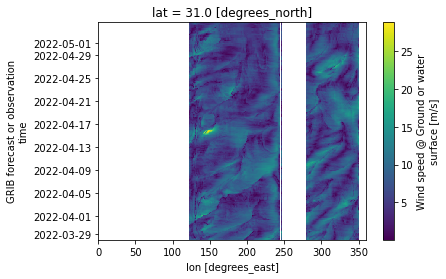

In [17]:
ds.Wind_speed_surface.sel(lat=31).plot(x="lon", y=tvar, cmap="viridis")

How easy was that!

One of xarray's very powerful tools tools is the ability to use the "split-apply-combine" paradigm which should be familiar to users of pandas. 

Here we group by day by using the `.day` attribute of the `datetime64` format.

In [18]:
gb = ds["Wind_speed_surface"].groupby(tvar +'.day')
gb

DataArrayGroupBy, grouped over 'day'
31 groups with labels 1, 2, 3, 4, 5, 6, ..., 27, 28, 29, 30, 31.

Awesome! We got a gropuby object back that allows us to do operations over the grouped dataset.

Lets go ahead and do that by computing a mean across the 31 days. We do this with the usual syntax on the `GroupBy` object. If we wanted something more complicated we could have used a `ufunc` for our custom function as we did in notebook 1.

Note that this computation is **quite expensive** and can take a while. If you are taking this course in tandem with the  `Dask` component, we will explote ways to make this computation faster later on.

In [19]:
gb.mean(dim=tvar)[:,:,:].hvplot(x='lon', y='lat', cmap='rainbow')

:DynamicMap   [day]
   :Image   [lon,lat]   (Wind_speed_surface)

Neat, we now have a daily average for our `Wind_speed_surface` variable.  Hopefully the interactive plot should be working for everyone.

We are not going to cover much more on computations on this large dataset as they can be a bit slow. The sky is the limit however and `xarray` comes with lots of built in super useful stuff for us, such as methods for computing rolling averages using `.rolling()` and the capacity to do almost anything you can do in numpy and/or pandas.

## Working with time, resampling and interpreting

Sometimes the timesteps we want to examine are larger or smaller than the data we have. We can use `resample` to downsample or upsample our data and `interp` to estimate the value at new timepoints that were not observed.

First lets downsample into two day intervals.

This is different from grouping as we have the flexibility to aggregate over different timeperiods. However we cannot use resample to group by values in categorical columns as you can do with `groupby`. I like to think of resample as a row wise aggregation only. 

In [22]:
ds_downsample = ds.Wind_speed_surface.resample(time='2d').mean(tvar)
ds_downsample.hvplot(x='lon', y='lat', cmap='rainbow')

:DynamicMap   [time]
   :Image   [lon,lat]   (Wind_speed_surface)

We can use resample to upsample  as well. Here we do it over 4 hour intervals, slightly more then the 6hr intervals in the model using a linear interpolation. Note that we didn't have to specify an aggregator, but instead an interpolation.

In [24]:
ds_upsample = ds.Wind_speed_surface.resample(time='4h').interpolate("linear")
ds_upsample.hvplot(x='lon', y='lat', cmap='rainbow')

:DynamicMap   [time]
   :Image   [lon,lat]   (Wind_speed_surface)

Down and upsampling is super powerfull and was again super easy all things considered.

## Conclusion

You have now worked with big data and complex `xarray` datasets in a large oceanographic model.  You are hopefully now familiar with all the basic concepts of `xarray`. Of course there are more details in the manual, but hopefully this is enough to get you started. 

You are now ready to start our challenge time permitting. 

**Jump over to [Notebook 4](./xarray_challenge_04.ipynb) now.** 